In [1]:
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import h5py, os
import numpy as np
from torch.utils.data import DataLoader
import torchvision.utils as vutils
from functions import transforms as T
from functions.subsample import MaskFunc
from scipy.io import loadmat
from matplotlib import pyplot as plt
import csv
import time
from skimage.measure import compare_ssim 

In [2]:
# this function can be used to convert k-space image unmasked real-valued image
# useful to visualize real-valued ground truth or test dataset
def kspace2real(data):
    return T.complex_abs(T.ifft2(T.to_tensor(data)))/norm
# this function is used to convert k-space image into masked real-valued image
def kspace2undreal(data,acc,center_fract,use_seed=False):
    slice_kspace = T.to_tensor(data)
    S, Ny, Nx, ps = slice_kspace.shape
    shape = np.array(slice_kspace.shape)
    mask_func = MaskFunc(center_fractions=[center_fract], accelerations=[acc])
    seed = None if not use_seed else tuple(map(ord, fname))
    mask = mask_func(shape, seed)
      
    # undersample
    masked_kspace = torch.where(mask == 0, torch.Tensor([0]), slice_kspace)
    masks = mask.repeat(S, Ny, 1, ps)

    img_und =T.ifft2(masked_kspace)
    norm = T.complex_abs(img_und).max()
    if norm < 1e-6: norm = 1e-6
    
    # normalized data
    img_und=img_und/norm
    return T.complex_abs(img_und)
#h5name='file1000990.h5'
def ssim(gt, pred):
    """ Compute Structural Similarity Index Metric (SSIM). """
    return compare_ssim(
        gt.transpose(1, 2, 0), pred.transpose(1, 2, 0), multichannel=True, data_range=gt.max()
    )

In [15]:
modtype='DCGAN'
best_model='DCGAN_G01.pth'
model_base_path='/home/students/lxr863/NeuralComp_G42-master/'+modtype
test_file_path='/data/local/NC2019MRI/test'
data_path_train='/data/local/NC2019MRI/train'
data_path_val='/data/local/NC2019MRI/train'

In [16]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'  # check whether a GPU is available
print(device)

cuda:0


In [17]:
for fname in sorted(os.listdir(model_base_path)):
    print('filename:',fname)

filename: DCGAN_G01.pth
filename: DCGAN_G03.pth


In [18]:
if modtype=='3L_CNN_8af' or modtype=='3L_CNN_4af':
    class CNN_3L(nn.Module):
        def __init__(self):
            super(CNN_3L,self).__init__()
            ### Patch Extraction n1=64 c=1 f1=9
            self.block1=nn.Conv2d(1,64,kernel_size=9,padding=2)
            ### Non-Linear Mapping n2=n1=64 f2=1
            self.block2=nn.Conv2d(64,32,kernel_size=1,padding=2)
            ### Image Reconstruction n3=n2=32 f3=5
            self.block3=nn.Conv2d(32,1,kernel_size=5,padding=2)
            self.RELU=nn.ReLU()
        def forward(self,out):
            out=self.block1(out)
            out=self.RELU(out)
            out=self.block2(out)
            out=self.RELU(out)
            out=self.block3(out)
            return out
    print('3L_CNN')
elif modtype=='4L_CNN_8af' or modtype=='4L_CNN_4af':
    class CNN_4L(nn.Module):
        def __init__(self):
            super(CNN_4L,self).__init__()
            ### Patch Extraction n1=64 c=1 f1=9
            self.block1=nn.Conv2d(1,64,kernel_size=9,padding=2)
            ### Non-Linear Mapping n2=n1=64 f2=1
            self.block2=nn.Conv2d(64,64,kernel_size=1,padding=2)
            ### Image Reconstruction n3=n2=32 f3=5
            self.block3=nn.Conv2d(64,32,kernel_size=5,padding=2)
            ### Image Reconstruction n4=n=32 f3=3
            self.block4=nn.Conv2d(32,1,kernel_size=3,padding=1)
            self.RELU=nn.ReLU()
        def forward(self,out):
            out=self.block1(out)
            out=self.RELU(out)
            out=self.block2(out)
            out=self.RELU(out)
            out=self.block3(out)
            out=self.RELU(out)
            out=self.block4(out)
            return out
    print('4L_CNN')
elif modtype=='UNet_8af' or modtype=='DCGAN':
    class DoubleConv(nn.Module):
        def __init__(self, in_channels, out_channels):
            super().__init__()
            self.double_conv = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True)
            )
        def forward(self, x):
            return self.double_conv(x)

    class Down(nn.Module):
        def __init__(self, in_channels, out_channels):
            super().__init__()
            self.maxpool_conv = nn.Sequential(
                nn.MaxPool2d(2),
                DoubleConv(in_channels, out_channels)
            )
        def forward(self, x):
            return self.maxpool_conv(x)

    class Up(nn.Module):
        def __init__(self, in_channels, out_channels, bilinear=True):
            super().__init__()
            if bilinear:
                self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            else:
                self.up = nn.ConvTranspose2d(in_channels // 2, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)
        def forward(self, x1, x2):
            x1 = self.up(x1)
            # input is CHW
            diffY = x2.size()[2] - x1.size()[2]
            diffX = x2.size()[3] - x1.size()[3]
            x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                            diffY // 2, diffY - diffY // 2])
            x = torch.cat([x2, x1], dim=1)
            return self.conv(x)

    class OutConv(nn.Module):
        def __init__(self, in_channels, out_channels):
            super(OutConv, self).__init__()
            self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)
        def forward(self, x):
            return self.conv(x)

    class UNet(nn.Module):
        def __init__(self, n_channels, n_classes, bilinear=True):
            super(UNet, self).__init__()
            self.n_channels = n_channels
            self.n_classes = n_classes
            self.bilinear = bilinear
            self.inc = DoubleConv(n_channels, 64)
            self.down1 = Down(64, 128)
            self.down2 = Down(128, 256)
            self.down3 = Down(256, 512)
            self.down4 = Down(512, 512)
            self.up1 = Up(1024, 256, bilinear)
            self.up2 = Up(512, 128, bilinear)
            self.up3 = Up(256, 64, bilinear)
            self.up4 = Up(128, 64, bilinear)
            self.outc = OutConv(64, n_classes)
        def forward(self, x):
            x1 = self.inc(x)
            x2 = self.down1(x1)
            x3 = self.down2(x2)
            x4 = self.down3(x3)
            x5 = self.down4(x4)
            x = self.up1(x5, x4)
            x = self.up2(x, x3)
            x = self.up3(x, x2)
            x = self.up4(x, x1)
            logits = self.outc(x)
            return logits
        
    class Generator(nn.Module):
        def __init__(self, n_channels, n_classes, bilinear=True):
            super(Generator, self).__init__()
            self.n_channels = n_channels
            self.n_classes = n_classes
            self.bilinear = bilinear
            self.inc = DoubleConv(n_channels, 64)
            self.down1 = Down(64, 128)
            self.down2 = Down(128, 256)
            self.down3 = Down(256, 512)
            self.down4 = Down(512, 512)
            self.up1 = Up(1024, 256, bilinear)
            self.up2 = Up(512, 128, bilinear)
            self.up3 = Up(256, 64, bilinear)
            self.up4 = Up(128, 64, bilinear) 
            self.outc = OutConv(64, n_classes)
        def forward(self, x):
            x1 = self.inc(x)
            x2 = self.down1(x1)
            x3 = self.down2(x2)
            x4 = self.down3(x3)
            x5 = self.down4(x4)
            x = self.up1(x5, x4)
            x = self.up2(x, x3)
            x = self.up3(x, x2)
            x = self.up4(x, x1)
            logits = self.outc(x)
            return logits
        
    class Discriminator(nn.Module):
        def __init__(self, ngpu):
            super(Discriminator, self).__init__()
            self.ngpu = ngpu
            self.main = nn.Sequential(
                # input is (nc) x 64 x 64
                nn.Conv2d(nc, ndf, 4, 3, 1, bias=False),
                nn.LeakyReLU(0.2, inplace=True),

                # state size. (ndf) x 32 x 32
                nn.Conv2d(ndf, ndf * 2, 4, 3, 1, bias=False),
                nn.BatchNorm2d(ndf * 2),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*2) x 16 x 16
                nn.Conv2d(ndf * 2, ndf * 4, 4, 3, 1, bias=False),
                nn.BatchNorm2d(ndf * 4),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*4) x 8 x 8
                nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 0, bias=False),
                nn.BatchNorm2d(ndf * 8),
                nn.LeakyReLU(0.2, inplace=True),
                # state size. (ndf*8) x 4 x 4
                nn.Conv2d(ndf * 8, 1, 4, 2, 0, bias=False),
                nn.Sigmoid()
            )

        def forward(self, input):
            return self.main(input)
    print('UNets')

UNets


# Inference of test dataset

In [19]:
if modtype=='3L_CNN_8af' or modtype=='3L_CNN_4af':
    model=CNN_3L().to(device)
    SSIMval=checkpoint['SSIM']
    print(type(losses))
    print(len(losses))
    print(len(SSIMval))
    plt.plot(range(len(losses)),losses,label="Training loss")
    plt.xlabel("backprops")
    plt.ylabel("MSE_Loss")
    plt.show()
    plt.plot(range(len(SSIMval)),SSIMval,label="SSIM loss")
    plt.xlabel("2xbackprops")
    plt.ylabel("SSIM_Loss")
    plt.show()
elif modtype=='4L_CNN_8af' or modtype=='4L_CNN_4af':
    model=CNN_4L().to(device)   
    SSIMval=checkpoint['SSIM']
    print(type(losses))
    print(len(losses))
    print(len(SSIMval))
    plt.plot(range(len(losses)),losses,label="Training loss")
    plt.xlabel("backprops")
    plt.ylabel("MSE_Loss")
    plt.show()
    plt.plot(range(len(SSIMval)),SSIMval,label="SSIM loss")
    plt.xlabel("2xbackprops")
    plt.ylabel("SSIM_Loss")
    plt.show()
elif modtype=='UNet_8af' or modtype=='DCGAN':
    model=Generator(1,1).to(device)

checkpoint=(torch.load(model_base_path+'/'+best_model))
model.load_state_dict(checkpoint['model_state_dict'])
losses=checkpoint['Loss']




In [20]:
# split dataset into train and validate
num_files=len(os.listdir(data_path_train))
index=(np.arange(num_files))

np.random.seed(42)
np.random.shuffle(index)
# we will split the train and validate data by 80:20
train_index=np.sort(index[:int(num_files*0.8)])
validate_index=np.sort(index[int(num_files*0.8):])
print('train:',train_index)
print('validate:',validate_index)

#print((index))
idn=[]
# create dictionary contains the information about the traindata and validation data from train dataset
data_list = {}
data_list['train']=[]
data_list['validate']=[]
for idx,fname in enumerate(sorted(os.listdir(data_path_train))): 
    subject_data_path = os.path.join(data_path_train, fname)         
    if not os.path.isfile(subject_data_path): continue         
    with h5py.File(subject_data_path, 'r') as data:
            num_slice = data['kspace'].shape[0]
    if len(np.where(train_index==idx)[0]):
        data_list['train']+=[(fname,subject_data_path,slice) for slice in range(5,num_slice)]
        #data_list['train']+=[(fname,subject_data_path,slice) for slice in range(5,num_slice)]
        #print('train_filename:',fname)
    else:
        data_list['validate']+=[(fname,subject_data_path,slice) for slice in range(5,num_slice)]
        #data_list['validate']+=[(fname,subject_data_path,slice) for slice in range(5,num_slice)]
        #print('validate_filename:',fname)

bsize=5
train_len=len(data_list['train'])
val_len=len(data_list['validate'])
total_epoch=train_len/bsize
if train_len%bsize>0:
    total_epoch+=1
print(len(data_list))
print(len(data_list['train']))
print(len(data_list['validate']))
train_name=['a']
k=0
for i,data in enumerate(data_list['train']):
    if train_name[k]!=data[0]:
        train_name.append(data[0])
        #print(data[0])
        k+=1
val_name=['a']
k=0
for i,data in enumerate(data_list['validate']):
    if val_name[k]!=data[0]:
        val_name.append(data[0])
        #print(data[0])
        k+=1
        
train_name.remove('a')
val_name.remove('a')
print(train_name)

train: [ 0  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 22 24 25 26 27 28 30
 31 32 33 34 35 36 38 39 40 41 42 44 45 46 47 48 49 50 53 54 55 56 57 58
 59 62 63 64 66 67 68 69]
validate: [ 1  2 14 20 21 23 29 37 43 51 52 60 61 65]
2
1699
435
['file1000000.h5', 'file1000026.h5', 'file1000031.h5', 'file1000033.h5', 'file1000041.h5', 'file1000052.h5', 'file1000071.h5', 'file1000073.h5', 'file1000107.h5', 'file1000108.h5', 'file1000114.h5', 'file1000126.h5', 'file1000178.h5', 'file1000182.h5', 'file1000190.h5', 'file1000196.h5', 'file1000201.h5', 'file1000243.h5', 'file1000254.h5', 'file1000263.h5', 'file1000264.h5', 'file1000267.h5', 'file1000273.h5', 'file1000280.h5', 'file1000283.h5', 'file1000291.h5', 'file1000292.h5', 'file1000308.h5', 'file1000314.h5', 'file1000323.h5', 'file1000328.h5', 'file1000344.h5', 'file1000350.h5', 'file1000356.h5', 'file1000389.h5', 'file1000464.h5', 'file1000476.h5', 'file1000477.h5', 'file1000480.h5', 'file1000496.h5', 'file1000528.h5', 'file1000537.h5',

In [26]:
#print(model)
norm=1e-6

acc = 4
cen_fract = 0.04
seed = False # random masks for each slice 
SSIM_baseline=[]
SSIM_network=[]
for tfname in val_name:
    print(tfname)

    
    with h5py.File(data_path_val+'/'+tfname,  "r") as hf:
        volume_kspace = hf['kspace'][()]
        
        print(f'{tfname}:',volume_kspace.shape)
        GT=kspace2real(volume_kspace)
        UND=kspace2undreal(volume_kspace,acc,cen_fract,seed)
        Shape=UND.shape
        UND2=UND.view(Shape[0],1,Shape[1],Shape[2]).to(device)
        REC=torch.rand(Shape[0],1,Shape[1],Shape[2])
        print(GT.shape)
        print(UND.shape)
        for slices in range(0,Shape[0]):
            REC[slices:slices+1]=torch.Tensor.cpu(model(UND2[slices:slices+1]).to(device)).detach()

        print(REC.squeeze(1).shape)
        
        '''
        
        SSIM_baseline.append(ssim(GT.numpy(), UND.numpy()))
        SSIM_network.append(ssim(GT.numpy(),REC.squeeze(1).numpy()))
        
        #print(Shape)

        hf=h5py.File('rec_'+tfname,'w')
        dset = hf.create_dataset("Rec_3L_4af", (Shape[0],1,Shape[1],Shape[2]))
        inp_und=inp.view(Shape[0],1,Shape[1],Shape[2]).to(device)
        for slices in range(0,Shape[0]):
            # Reconstruct the Image by passing undersampled image to the Network
            dset[slices:slices+1]=torch.Tensor.cpu(model(inp_und[slices:slices+1]).to(device)).detach().numpy()
        #print(inp_und[:].shape)
    hf.close()    
        '''
    
    

file1000007.h5
file1000007.h5: (38, 640, 368)
torch.Size([38, 640, 368])
torch.Size([38, 640, 368])
torch.Size([38, 640, 368])


/bham/modules/roots/neural-comp/2019-20/lib/python3.6/site-packages/ipykernel_launcher.py:29: UserWarning: DEPRECATED: skimage.measure.compare_ssim has been moved to skimage.metrics.structural_similarity. It will be removed from skimage.measure in version 0.18.


file1000017.h5
file1000017.h5: (34, 640, 372)
torch.Size([34, 640, 372])
torch.Size([34, 640, 372])
torch.Size([34, 640, 372])
file1000153.h5
file1000153.h5: (34, 640, 372)
torch.Size([34, 640, 372])
torch.Size([34, 640, 372])
torch.Size([34, 640, 372])
file1000206.h5
file1000206.h5: (35, 640, 372)
torch.Size([35, 640, 372])
torch.Size([35, 640, 372])
torch.Size([35, 640, 372])
file1000229.h5
file1000229.h5: (35, 640, 372)
torch.Size([35, 640, 372])
torch.Size([35, 640, 372])
torch.Size([35, 640, 372])
file1000247.h5
file1000247.h5: (36, 640, 372)
torch.Size([36, 640, 372])
torch.Size([36, 640, 372])
torch.Size([36, 640, 372])
file1000277.h5
file1000277.h5: (42, 640, 356)
torch.Size([42, 640, 356])
torch.Size([42, 640, 356])
torch.Size([42, 640, 356])
file1000325.h5
file1000325.h5: (33, 640, 372)
torch.Size([33, 640, 372])
torch.Size([33, 640, 372])
torch.Size([33, 640, 372])
file1000432.h5
file1000432.h5: (34, 640, 372)
torch.Size([34, 640, 372])
torch.Size([34, 640, 372])
torch.Size(

Text(0.5, 1.0, 'SSIM value of 3L-SRCNN')

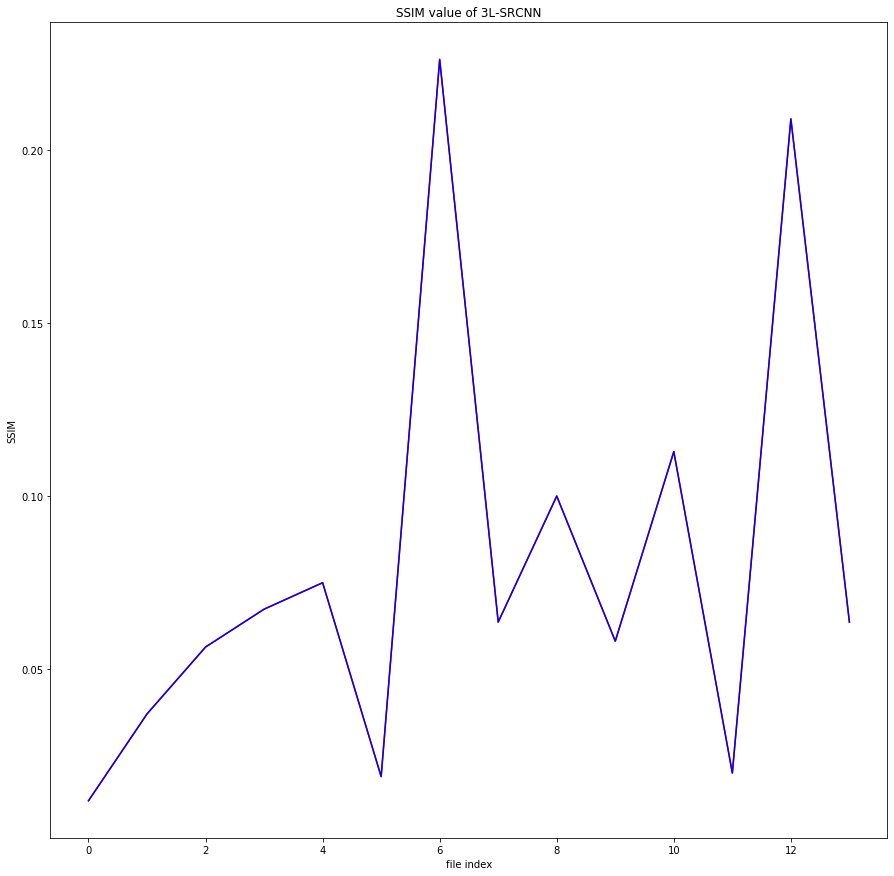

In [27]:
plt.figure(figsize=(15,15))
plt.plot(range(0,len(SSIM_baseline)),SSIM_baseline,'r')
plt.plot(range(0,len(SSIM_network)),SSIM_baseline,'b')
plt.xlabel("file index")
plt.ylabel("SSIM")
plt.title("SSIM value of 3L-SRCNN")

/bham/modules/roots/neural-comp/2019-20/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


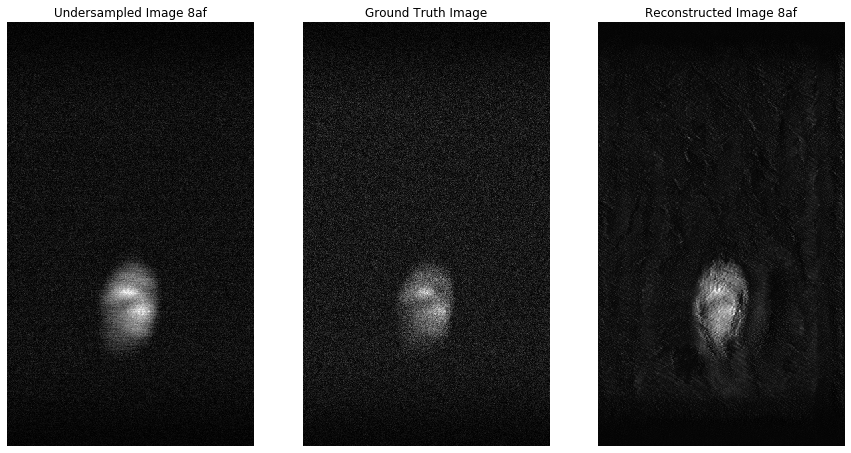

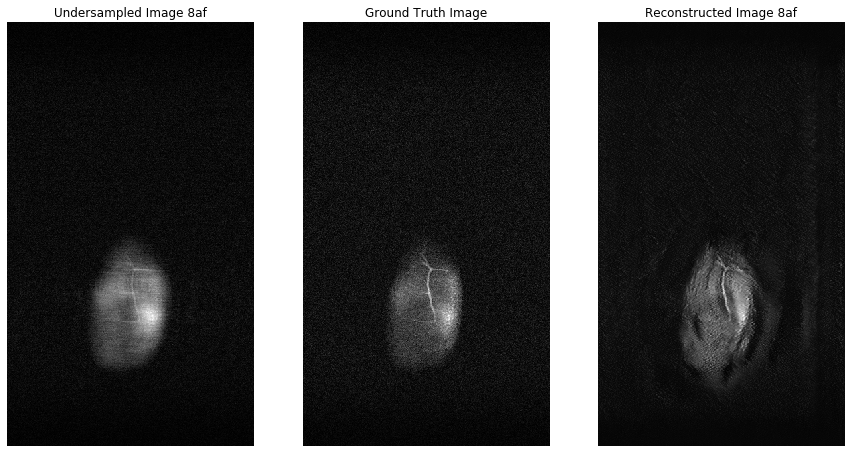

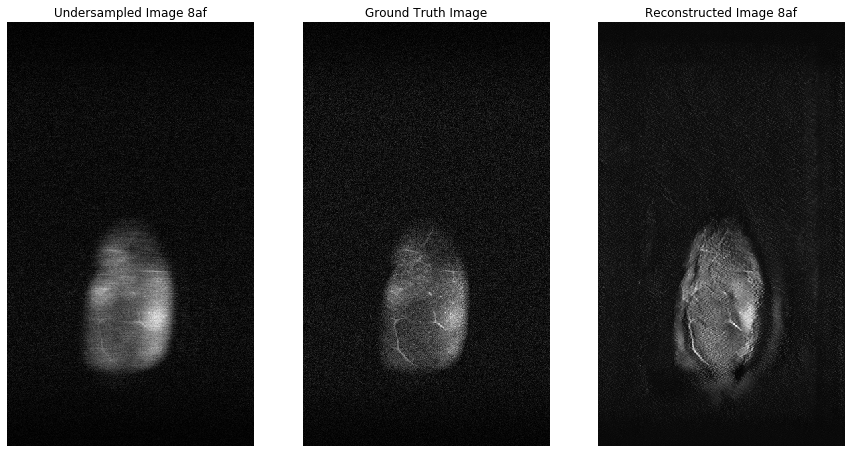

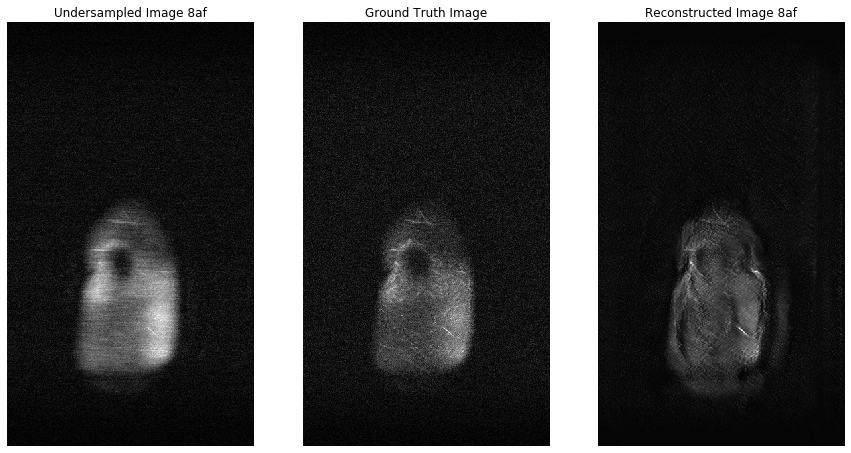

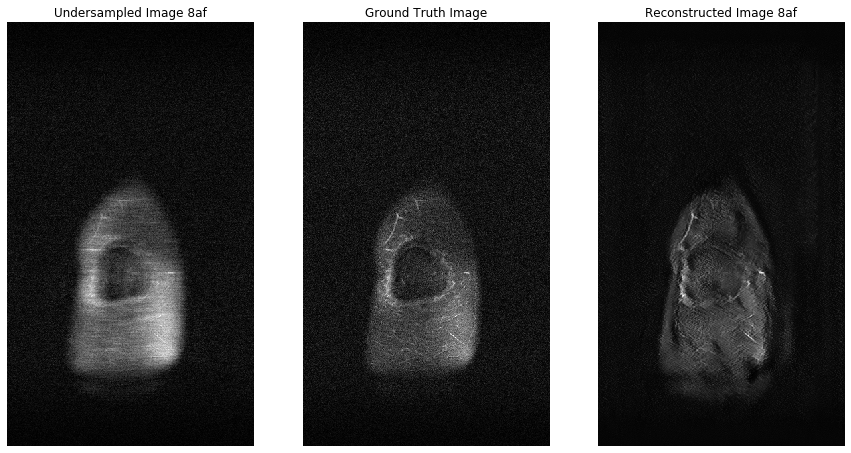

...

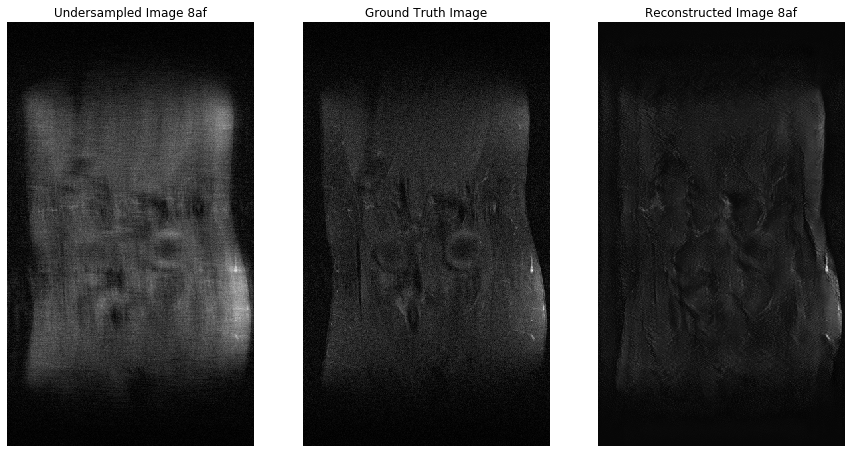

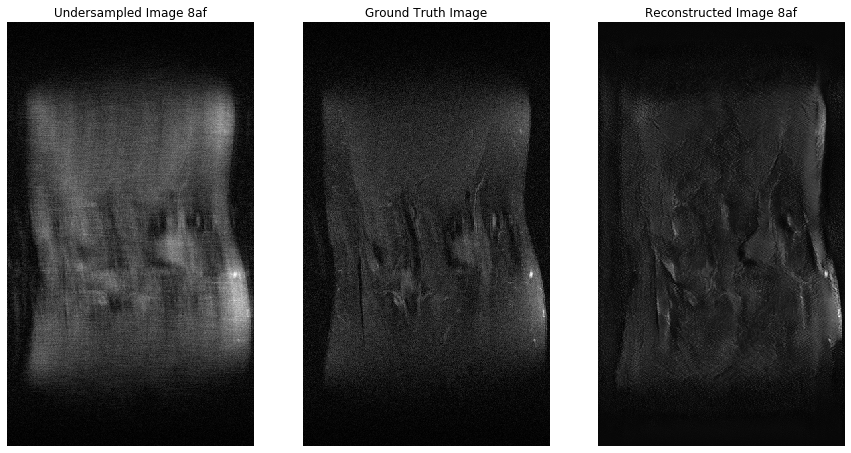

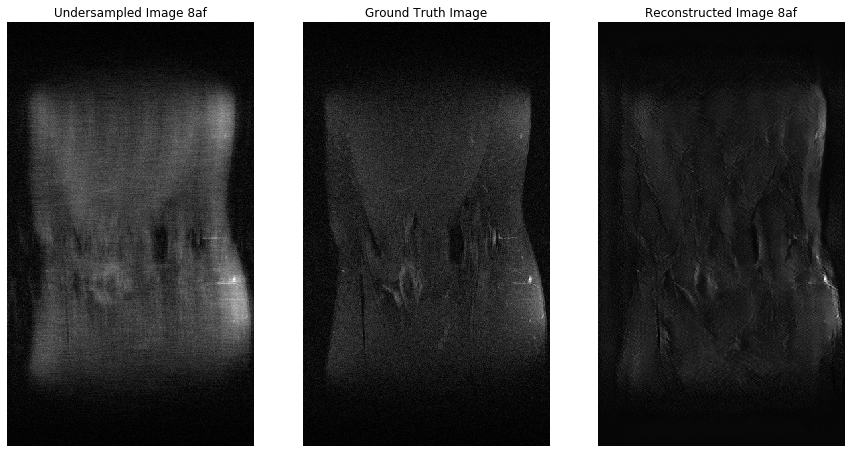

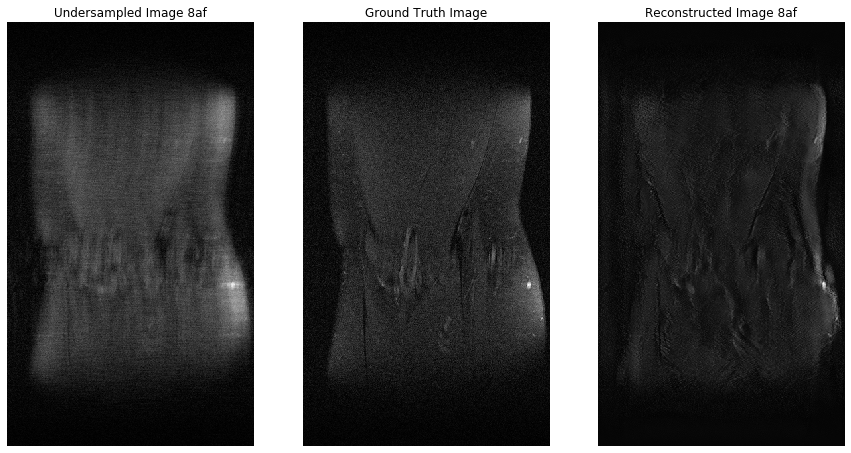

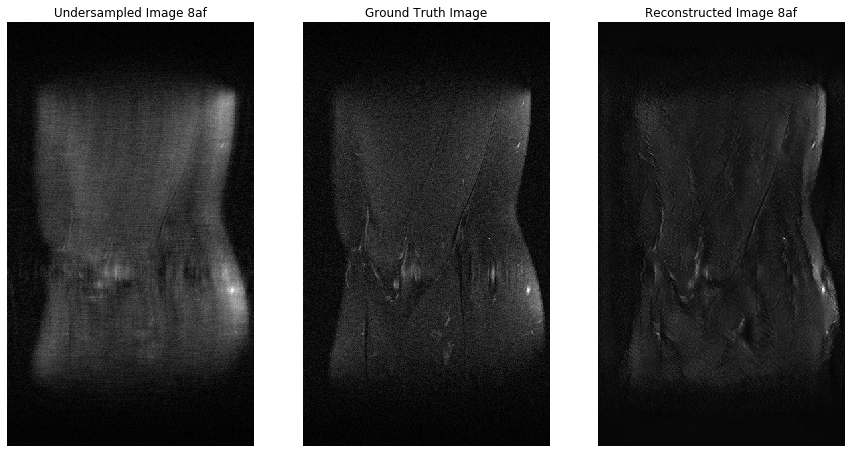

In [28]:
ushape=UND.shape
for index in range(0,ushape[0]):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.axis("off")
    plt.title("Undersampled Image 8af")
    plt.imshow(torch.Tensor.cpu(UND[index]),cmap='gray')
    plt.subplot(1,3,2)
    plt.axis("off")
    plt.title("Ground Truth Image")
    plt.imshow(torch.Tensor.cpu(GT[index]),cmap='gray')
    plt.subplot(1,3,3)
    plt.axis("off")
    plt.title("Reconstructed Image 8af")
    plt.imshow(torch.Tensor.cpu(REC[index][0]),cmap='gray')

In [ ]:
print(dset.shape)